# Socioeconomic Segregation in the Detroit Public Schools Community District (DPSCD)

Authored by Sydney Schwartz, Thomas Friss, Robby Waite, and Justin Young

In [1]:
%%html
<a href="https://github.com/youngju87/SIADS697_TeamMADScientists">Github Repository</a></br>
<a href="https://drive.google.com/file/d/1bQHgTc3gUr5c7ayGb9V0_VivA0YzUHVm/view?usp=sharing">Video Walkthrough</a>

We set out to explore the Detroit Public Schools Community District (DPSCD). The DPSCD has 107 schools and over 48,000 students. Additionally, DPSCD is the only school district within the Detroit area. Making, DPSCD, one of the largest school districts in the United States. The city of Detroit is also the most diverse area within the state of Michigan. The size, diversity, and history of DPSCD makes us question if socioeconomic segregation may be present.

There has been extensive research on how income differences across school districts correlates to inequality in socioeconomic resources available. We know that inequality exists, but does it exist in the Detroit area? In this study, we explored four different data sets to compare the schools within 27 different zip code areas that create DPSCD. The data sets include test score data from the DPSCD open data files, US census small area income and poverty estimates (SAIPE) containing Per Pupil Expenditure (PPE), GIS open data on school district boundaries, and USA census tract areas on median household income

This study encompasses a large amount of data focused on the Detroit Metro Area. With advanced data cleaning and analysis techniques, the team is equipped to explore correlations, insights, and statistical evidence to help us understand socioeconomic segregation within the DPSCD. Finding out if segregation exists, we can help parents and students make an informed decision on what schools to go to. Additionally, this information could inform district authorities so they can gain a better understanding of schools that may need to address possible socioeconomic segregation within the DPSCD.


#### Import Libraries

In [2]:
%reload_ext watermark
# Basic Library
import pandas as pd
import numpy as np
import requests
import json
from pandas.io.json import json_normalize
from babel.numbers import format_currency
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import seaborn as sns
plt.style.use('ggplot')

# Building Interactive map
import geopandas as gpd
import folium
import shapely.geometry
import shapely.wkt
from folium.plugins import StripePattern
from folium.plugins import MarkerCluster
from shapely.geometry import Polygon
import fiona
from shapely.geometry import shape
import branca.colormap as cm

# Building KMeans Cluster model
from sklearn import preprocessing
from sklearn.cluster import KMeans

# Building Causal model
import statsmodels.api as sm
import statsmodels.formula.api as smf
from causalinference import CausalModel
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# Building Random Forest model
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error as mae
from sklearn.model_selection import RandomizedSearchCV

#Plotly package for general visualizations
import plotly.express as px


#### Function Bank

In [3]:
# Polygon + Point Functions
def poly_func(df):
    poly_lst = []
    for i in df['geometry.coordinates']:
        df_poly = Polygon(i[0])
        poly_lst.append(df_poly)

    df['poly'] = poly_lst
    df['geometry.coordinates'] = df['geometry.coordinates'].apply(lambda x: list(reversed(x)))
    return df

def point_func(df):
    point_lst = []
    for i in df['geometry.coordinates']:
        df_point = shapely.geometry.Point(i)
        point_lst.append(df_point)

    df['points'] = point_lst
    df['geometry.coordinates'] = df['geometry.coordinates'].apply(lambda x: list(reversed(x)))
    return df

# Group Filter and Conversion Functions
def filter_groups(text):
    '''
    Specific function for merging purposes. Converts 'Black, ...' entries to 
    'African American' & 'White,...' entries to 'White' in testing data
    '''
    if text.startswith('Black'):
        return 'African American'
    if text.startswith('White'):
        return 'White'
    else: return text

def text_to_number(text):
    '''
    Specific funtion for removing unwanted < & > signs from numeric columns
    '''
    if text in ['<10', '< 10']:
        return 5
    elif text in ['<5', '< 5', '<5%']:
        return 1
    elif text == '>95%':
        return 95
    else:
        try: return float(text)
        except: return text

#### Data Requests

In [4]:
# Detroit Zip Code Map v2 ShapeFile
geodf_det_zip = gpd.read_file('/work/SIADS697_TeamMADScientists/assets/det_shp/Geography.shp')
geodf_det_zip.columns = geodf_det_zip.columns.str.replace('Key', 'zip_code')
geodf_det_zip = geodf_det_zip.fillna(0).drop_duplicates()

# Detroit School Boundaries ShapeFile
geodf_dcs = gpd.read_file('/work/SIADS697_TeamMADScientists/assets/sabs_1516/SABS_1516.shp')
geodf_dcs_mi = geodf_dcs[(geodf_dcs['stAbbrev'] == "MI") & (geodf_dcs['level'] != '4') & (geodf_dcs['level'] != '1') & (geodf_dcs['level'] != '3')]
conditions = [
    (geodf_dcs_mi['level'] == '1'),
    (geodf_dcs_mi['level'] == '2'),
    (geodf_dcs_mi['level'] == '3'),
    (geodf_dcs_mi['level'] == '4')
]
values = ['gold','blue','green','white']
geodf_dcs_mi['color'] = np.select(conditions, values)

# Demographics by Zip Code Detroit
demo_zip = pd.read_excel('/work/SIADS697_TeamMADScientists/assets/capstone_demographics_2.xlsx',engine='openpyxl')
demo_zip_T = demo_zip.T
demo_zip_T.columns = demo_zip_T.iloc[0]
demo_zip_final = demo_zip_T.iloc[1: , :]
demo_zip_final.reset_index(inplace=True)
demo_zip_final.columns = demo_zip_final.columns.str.replace('index', 'zip_code')
demo_zip_final = demo_zip_final.fillna(0).drop_duplicates()

# Joined PPE & Testing Datasets (From RW)
ppe_testing_df_all = pd.read_excel('/work/SIADS697_TeamMADScientists/assets/saved_data/all_1819_df_v1.xlsx')
ppe_testing_df_all.drop(['Unnamed: 0','Not Title I Funded','Title I Funded'],axis=1,inplace=True)
    # Expand Multi Level Data
ppe_testing_df_all_melt = pd.pivot(ppe_testing_df_all,index=['SCHOOL YEAR', 'SCH NAME', 'StateLocalPpeSchoolShare',
                                                          'StateLocalPpeDistrictShare', 'FederalPpeSchoolShare',
                                                          'FederalPpeDistrictShare', 'TotalPpeSchoolShare',
                                                          'TotalPpeDistrictShare', 'TotalPpeTotal', 'StreetAddress', 'City',
                                                          'ZipCode', 'Students', 'Teachers', 'studentsperteacher','BuildingName'], 
                                                   columns='Subject',
                                                   values=['NumberAboveAverageGrowth', 'NumberAverageGrowth',
                                                           'NumberBelowAverageGrowth', 'PercentAboveAverage',
                                                           'PercentAverageGrowth', 'PercentBelowAverage', 'TotalIncluded',
                                                           'MeanSGP'])
ppe_testing_df_all_melt.columns = ppe_testing_df_all_melt.columns.map('|'.join).str.strip('|')
ppe_testing_df_all_mod = ppe_testing_df_all_melt.rename_axis(None,axis=1)
ppe_testing_df_all_mod = ppe_testing_df_all_mod.reset_index().fillna(0)
ppe_testing_df_all_mod.rename(columns={"SCH NAME": "SCHOOL NAME","ZipCode":"zip_code"},inplace=True)
school_lst = ppe_testing_df_all_mod['SCHOOL NAME'].unique().tolist()

# ADD ZIP DEMOS TO TESTING
ppe_testing_df_all_mod = ppe_testing_df_all_mod.merge(demo_zip_final, on='zip_code', how='inner').drop_duplicates()

# Detroit School Marker Point Data
detroit_school_marker = requests.get("https://services2.arcgis.com/qvkbeam7Wirps6zC/arcgis/rest/services/2018_2019_Schools_(EEM)/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson").text
detroit_school_marker_json = json.loads(detroit_school_marker)
detroit_school_marker_df = pd.json_normalize(detroit_school_marker_json['features'])
detroit_school_marker_df['properties.EntityOfficialName'] = detroit_school_marker_df['properties.EntityOfficialName'].str.upper()
detroit_school_marker_df['properties.EntityOfficialName'] = detroit_school_marker_df['properties.EntityOfficialName'].str.replace(".","")
detroit_school_marker_df = detroit_school_marker_df[detroit_school_marker_df['properties.EntityOfficialName'].isin(school_lst)]
detroit_school_marker_df.rename(columns={"properties.EntityOfficialName": "SCHOOL NAME"},inplace=True)

# Detroit PS PPExTesting Data
ppe_testing_df_all = pd.read_excel('/work/SIADS697_TeamMADScientists/assets/saved_data/all_1819_df_v1.xlsx')

/shared-libs/python3.9/py/lib/python3.9/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_938/4085797795.py:55: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  detroit_school_marker_df['properties.EntityOfficialName'] = detroit_school_marker_df['properties.EntityOfficialName'].str.replace(".","")


In [5]:
# Build Working Dataframe
det_school_testing_mod = ppe_testing_df_all_mod[['SCHOOL NAME',
                                                'StateLocalPpeSchoolShare',
                                                'FederalPpeSchoolShare',
                                                'TotalPpeSchoolShare',
                                                'TotalPpeTotal',
                                                'Students',
                                                'Teachers',
                                                'studentsperteacher',
                                                'NumberAboveAverageGrowth|English Language Arts',
                                                'NumberAboveAverageGrowth|Mathematics',
                                                'NumberAboveAverageGrowth|Science',
                                                'NumberAboveAverageGrowth|Social Studies',
                                                'NumberAverageGrowth|English Language Arts',
                                                'NumberAverageGrowth|Mathematics',
                                                'NumberAverageGrowth|Science',
                                                'NumberAverageGrowth|Social Studies',
                                                'NumberBelowAverageGrowth|English Language Arts',
                                                'NumberBelowAverageGrowth|Mathematics',
                                                'NumberBelowAverageGrowth|Science',
                                                'NumberBelowAverageGrowth|Social Studies',
                                                'PercentAboveAverage|English Language Arts',
                                                'PercentAboveAverage|Mathematics',
                                                'PercentAboveAverage|Science',
                                                'PercentAboveAverage|Social Studies',
                                                'PercentAverageGrowth|English Language Arts',
                                                'PercentAverageGrowth|Mathematics',
                                                'PercentAverageGrowth|Science',
                                                'PercentAverageGrowth|Social Studies',
                                                'PercentBelowAverage|English Language Arts',
                                                'PercentBelowAverage|Mathematics',
                                                'PercentBelowAverage|Science',
                                                'PercentBelowAverage|Social Studies',
                                                'MeanSGP|English Language Arts',
                                                'MeanSGP|Mathematics',
                                                'MeanSGP|Science',
                                                'MeanSGP|Social Studies',
                                                'Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame',
                                                'Basic Variables Income:Race And Ethnicity - Median Household Income Whi',
                                                'Husband-Wife Family, Own Children, Below Poverty',
                                                'Basic Variables Income - Family Households Mean Family Household Income',
                                                ]].copy()
det_school_working_df = det_school_testing_mod.reset_index().sort_values(by=['SCHOOL NAME'])
det_school_working_df = det_school_working_df.rename_axis(None, axis=1).reset_index(drop=True)
det_school_working_df = det_school_working_df.drop(columns=['index'])

## Household Income and Per Pupil Spending Showing a Negative Relationship

The first thing we would like to do is create a correlation matrix. A correlation matrix, often referred to as a “heat map”, will allow us to visualize the relationships between the variables in our data sets. The deeper the green the stronger the positive relationship, the deeper the red the weaker the relationship and yellow represents little to no correlation.  

/tmp/ipykernel_938/392579843.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(det_school_working_df.corr(), dtype=np.bool))


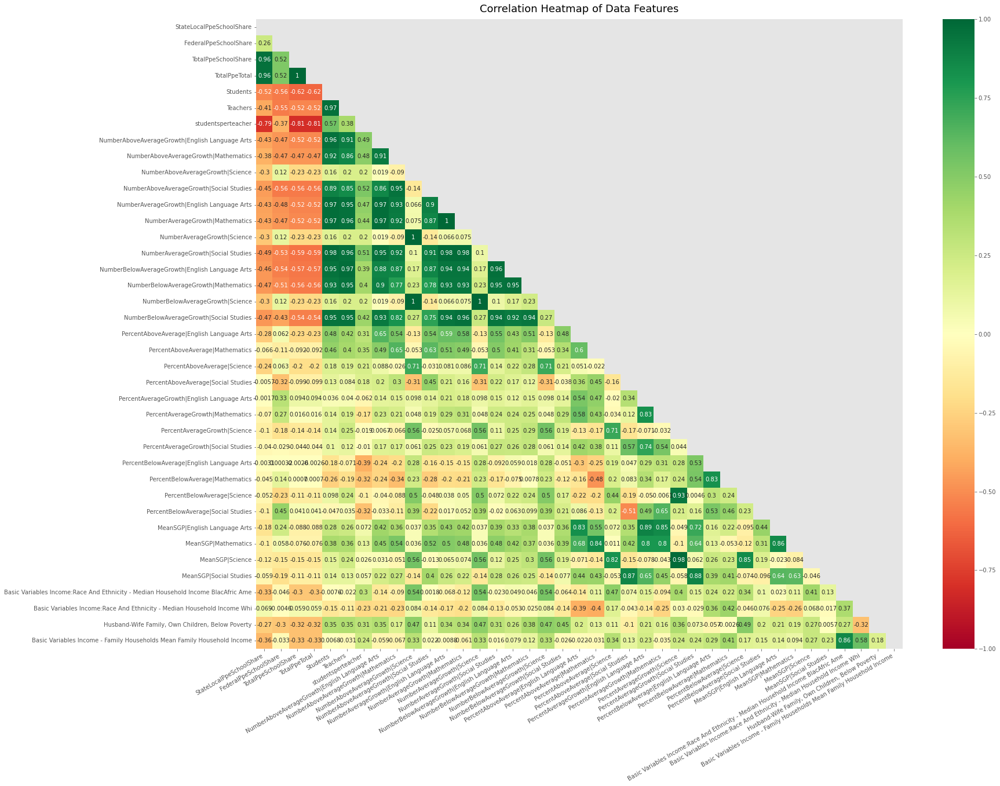

In [6]:
# Correlation Heatmap
mask = np.triu(np.ones_like(det_school_working_df.corr(), dtype=np.bool))
plt.figure(figsize=(25, 20))
heatmap = sns.heatmap(det_school_working_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap.set_title('Correlation Heatmap of Data Features', fontdict={'fontsize':18}, pad=12);
plt.xticks(rotation=30, horizontalalignment='right')
plt.show()

With our correlation matrix, we can quickly see that there are several weak to strong relationships between variables. There is a moderate negative relationship between Total PPE (Per Pupil Spending) and Household Income (-0.33) There is also a moderate negative relationship between Total PPE and Families Below Poverty (-0.32). However, our attention is drawn to the little to no relationship between Total PPE and Percent Average Growth, for both Math and Language Arts (0.016 and 0.094 respectively). This is surprising given our hypothesis that Per Pupil Spending had a strong relationship with testing performance. It's still too early to make conclusions, however, this is good to keep in consideration moving forward.

## Top Features Include Test Scores and Household Income

Features and feature engineering will allow us to determine which features to consider given their importance and ability to predict an output variable. A feature is considered valuable if its changing values increases model error. In other words, the model relied on the feature for prediction. (Molnar, 2022)

Let's begin looking at which features are the most important with a Random Forest Regressor. 

The first step will be to tune the hyper-parameters. Tuning hyper-parameters maximizes the model’s performance and minimizes predefined loss function to produce better results with fewer errors. (Navas, 2022)  The Random Forest Regressor has many options for hyper-parameters. To speed up the process, for deciding which hyper-parameters work best, we test each option at scale.

In [7]:
#Hyperparameter Tuning (Koehrsen, 2018)
"""
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
"""

"\n# Number of trees in random forest\nn_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]\n\n# Number of features to consider at every split\nmax_features = ['auto', 'sqrt']\n\n# Maximum number of levels in tree\nmax_depth = [int(x) for x in np.linspace(10, 110, num = 11)]\nmax_depth.append(None)\n\n# Minimum number of samples required to split a node\nmin_samples_split = [2, 5, 10]\n\n# Minimum number of samples required at each leaf node\nmin_samples_leaf = [1, 2, 4]\n\n# Method of selecting samples for training each tree\nbootstrap = [True, False]\n\n# Create the random grid\nrandom_grid = {'n_estimators': n_estimators,\n               'max_features': max_features,\n               'max_depth': max_depth,\n               'min_samples_split': min_samples_split,\n               'min_samples_leaf': min_samples_leaf,\n               'bootstrap': bootstrap}\n"

In [8]:
# Random Grid to Search for Best Hyperparameters (Koehrsen, 2018)
"""
# Base model to tune
rf = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

# Setting X and y variables
X1 = X1 = det_school_working_df.loc[:, ~det_school_working_df.columns.isin(['PercentAverageGrowth|Mathematics', 'SCHOOL NAME'])]
y1 = det_school_working_df['PercentAverageGrowth|Mathematics']

X2 = X1 = det_school_working_df.loc[:, ~det_school_working_df.columns.isin(['PercentAverageGrowth|English Language Arts', 'SCHOOL NAME'])]
y2 = det_school_working_df['PercentAverageGrowth|English Language Arts']

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=.20, random_state=0)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=.20, random_state=0)

# Fit the random search model
rf_random1 = rf_random.fit(X_train1, y_train1)
rf_random2 = rf_random.fit(X_train2, y_train2)

print(rf_random1.best_params_)
print(rf_random2.best_params_)
"""

"\n# Base model to tune\nrf = RandomForestRegressor()\n\n# Random search of parameters, using 3 fold cross validation, \n# search across 100 different combinations, and use all available cores\nrf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)\n\n# Setting X and y variables\nX1 = X1 = det_school_working_df.loc[:, ~det_school_working_df.columns.isin(['PercentAverageGrowth|Mathematics', 'SCHOOL NAME'])]\ny1 = det_school_working_df['PercentAverageGrowth|Mathematics']\n\nX2 = X1 = det_school_working_df.loc[:, ~det_school_working_df.columns.isin(['PercentAverageGrowth|English Language Arts', 'SCHOOL NAME'])]\ny2 = det_school_working_df['PercentAverageGrowth|English Language Arts']\n\nX_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=.20, random_state=0)\nX_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=.20, random_state=0)\n\n# Fit the random search

Now, we can move on to the Random Forest model so we can determine the importance of each feature.

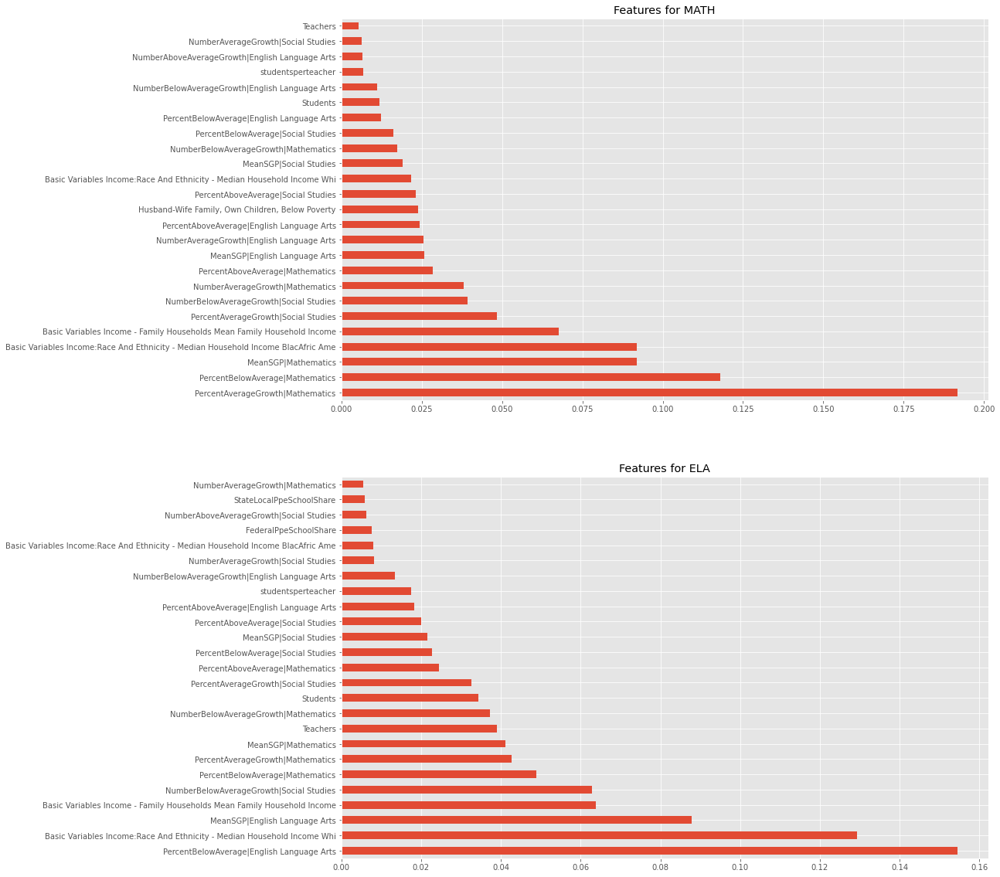

In [9]:
# Setting X and y variables
X1 = X1 = det_school_working_df.loc[:, ~det_school_working_df.columns.isin(['PercentAverageGrowth|Mathematics', 'SCHOOL NAME'])]
y1 = det_school_working_df['PercentAverageGrowth|Mathematics']

X2 = X1 = det_school_working_df.loc[:, ~det_school_working_df.columns.isin(['PercentAverageGrowth|English Language Arts', 'SCHOOL NAME'])]
y2 = det_school_working_df['PercentAverageGrowth|English Language Arts']

X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=.20, random_state=0)
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=.20, random_state=0)

model1 = RandomForestRegressor(n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features="sqrt", max_depth=100, bootstrap=False)
model2 = RandomForestRegressor(n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features="sqrt", max_depth=100, bootstrap=False)
model1.fit(X_train1, y_train1)
model2.fit(X_train2, y_train2)

pred1 = model1.predict(X_test1)
pred2 = model2.predict(X_test2)

# Visualizing Feature Importance
fig, (ax1, ax2) = plt.subplots(2,1)
fig.set_size_inches(15, 20)

feat_importances1 = pd.Series(model1.feature_importances_, index=X1.columns)
feat_importances1.nlargest(25).plot(kind='barh',ax=ax1,title='Features for MATH')

feat_importances2 = pd.Series(model2.feature_importances_, index=X2.columns)
feat_importances2.nlargest(25).plot(kind='barh',ax=ax2, title='Features for ELA')

plt.show()

The pattern we see here is Percent Below Average, Percent Average Growth, Household Income, and MeanSGP features are generally the most important. We will work with this set of important features moving forward. This ended up cutting our total feature set by almost half.

In [10]:
# NEW FEATURE DF
feat1 = feat_importances1.nlargest(25).to_frame().reset_index()
feat1 = list(feat1.iloc[:, 0])
feat2 = feat_importances2.nlargest(25).to_frame().reset_index()
feat2 = list(feat2.iloc[:, 0])
unique_feat = list(set(feat1 + feat2 + ['SCHOOL NAME','PercentAverageGrowth|English Language Arts','TotalPpeTotal']))

det_school_working_df = det_school_working_df.loc[:,det_school_working_df.columns.isin(unique_feat)]

With our features set based on importance, we can now see which features to test against our hypothesis in order to discover strong, weak, positive, and negative relationships.

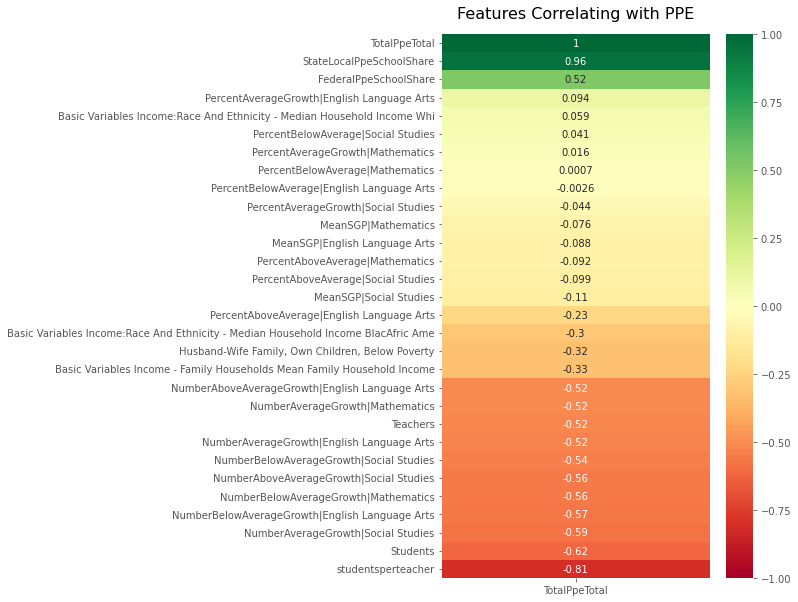

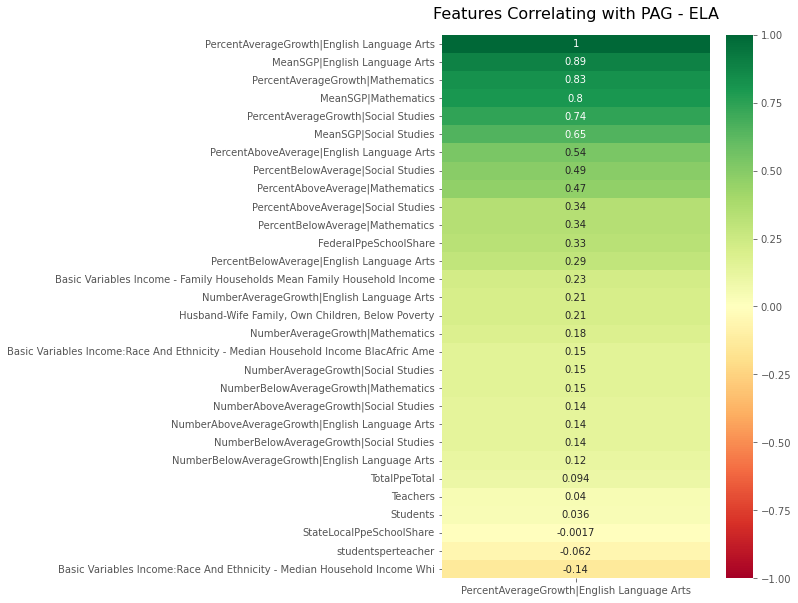

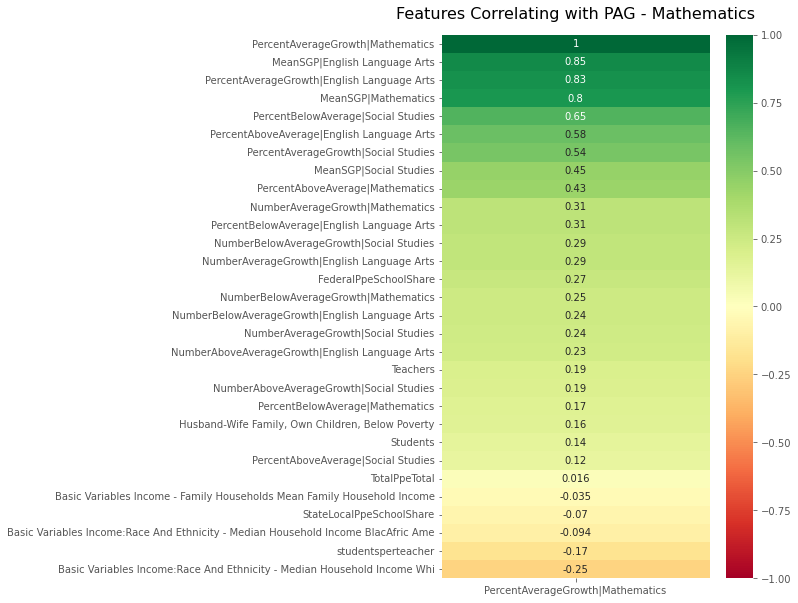

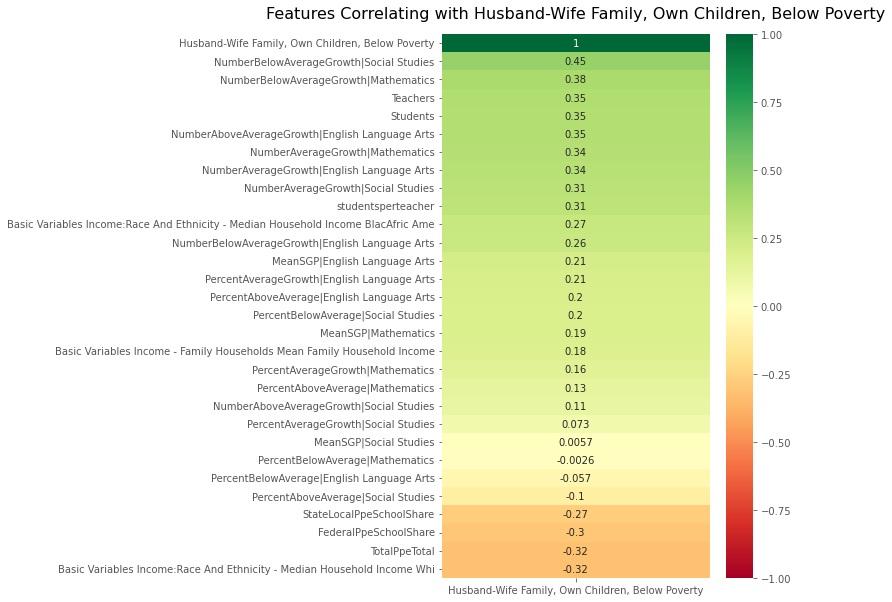

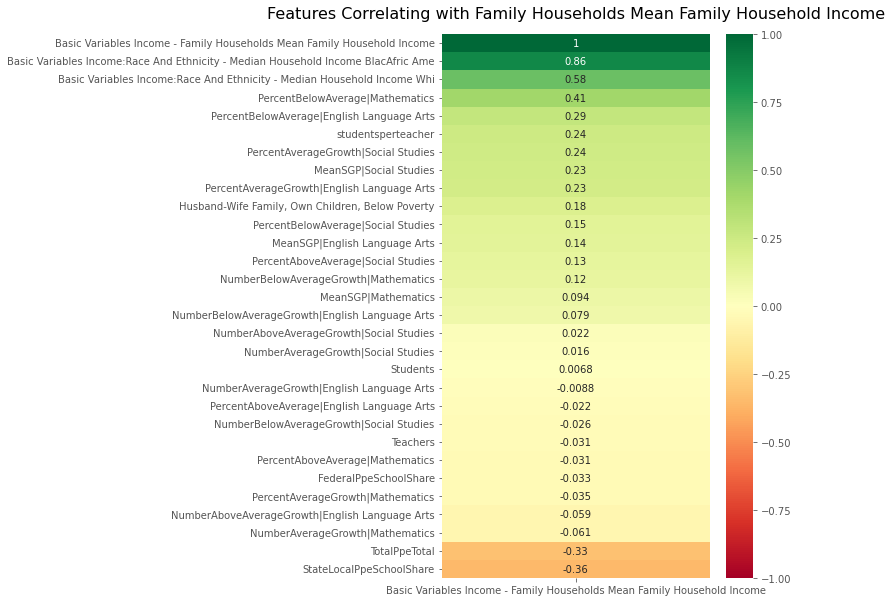

In [11]:
#Features Correlation

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_working_df.corr()[['TotalPpeTotal']].sort_values(by='TotalPpeTotal', ascending=False), vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap.set_title('Features Correlating with PPE', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_working_df.corr()[['PercentAverageGrowth|English Language Arts']].sort_values(by='PercentAverageGrowth|English Language Arts', ascending=False), vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap.set_title('Features Correlating with PAG - ELA', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_working_df.corr()[['PercentAverageGrowth|Mathematics']].sort_values(by='PercentAverageGrowth|Mathematics', ascending=False), vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap.set_title('Features Correlating with PAG - Mathematics', fontdict={'fontsize':16}, pad=16);

#plt.figure(figsize=(6, 10))
#heatmap = sns.heatmap(det_school_working_df.corr()[['Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame']].sort_values(by='Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
#heatmap.set_title('Features Correlating with Median Household Income BlacAfric Ame', fontdict={'fontsize':16}, pad=16);

#plt.figure(figsize=(6, 10))
#heatmap = sns.heatmap(det_school_working_df.corr()[['Basic Variables Income:Race And Ethnicity - Median Household Income Whi']].sort_values(by='Basic Variables Income:Race And Ethnicity - Median Household Income Whi', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
#heatmap.set_title('Features Correlating with Median Household Income Whi', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_working_df.corr()[['Husband-Wife Family, Own Children, Below Poverty']].sort_values(by='Husband-Wife Family, Own Children, Below Poverty', ascending=False), vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap.set_title('Features Correlating with Husband-Wife Family, Own Children, Below Poverty', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_working_df.corr()[['Basic Variables Income - Family Households Mean Family Household Income']].sort_values(by='Basic Variables Income - Family Households Mean Family Household Income', ascending=False), vmin=-1, vmax=1, annot=True, cmap='RdYlGn')
heatmap.set_title('Features Correlating with Family Households Mean Family Household Income', fontdict={'fontsize':16}, pad=16);

Now, given our hypothesis, we will take a look at plotting the relationship of Total PPE (Per Pupil Spending) against our Percent Average Growth for Math and Language Arts as well as Families Below Poverty and Household Incomes.

Pearsons correlation Math: 0.016
Pearsons correlation ELA: 0.094
Pearsons correlation Family/Poverty: -0.323
Pearsons correlation HH Income: -0.326


<AxesSubplot:xlabel='TotalPpeTotal', ylabel='Basic Variables Income - Family Households Mean Family Household Income'>

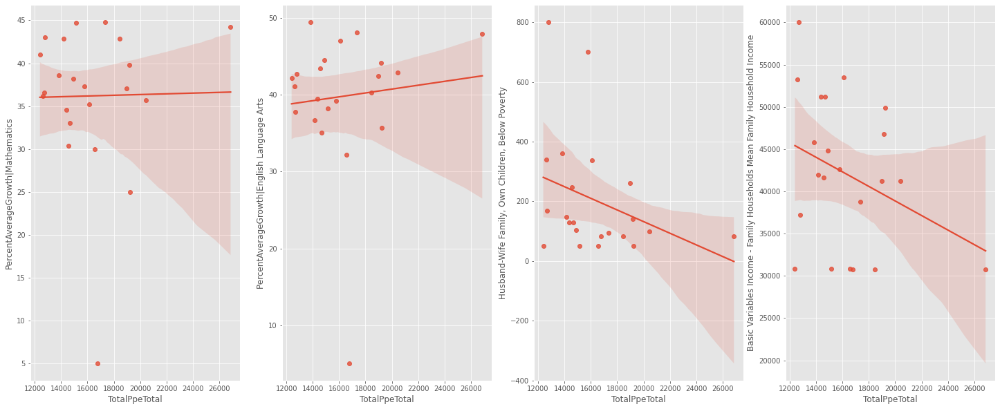

In [12]:
# REGRESSION PLOT #
corr1, _ = pearsonr(det_school_working_df['TotalPpeTotal'], det_school_working_df['PercentAverageGrowth|Mathematics'])
corr2, _ = pearsonr(det_school_working_df['TotalPpeTotal'], det_school_working_df['PercentAverageGrowth|English Language Arts'])
corr3, _ = pearsonr(det_school_working_df['TotalPpeTotal'], det_school_working_df['Husband-Wife Family, Own Children, Below Poverty'])
corr4, _ = pearsonr(det_school_working_df['TotalPpeTotal'], det_school_working_df['Basic Variables Income - Family Households Mean Family Household Income'])
print('Pearsons correlation Math: %.3f' % corr1)
print('Pearsons correlation ELA: %.3f' % corr2)
print('Pearsons correlation Family/Poverty: %.3f' % corr3)
print('Pearsons correlation HH Income: %.3f' % corr4)
#plt.show()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4)
fig.set_size_inches(25, 10)
sns.regplot(x=det_school_working_df['TotalPpeTotal'], y=det_school_working_df['PercentAverageGrowth|Mathematics'], ax=ax1)
sns.regplot(x=det_school_working_df['TotalPpeTotal'], y=det_school_working_df['PercentAverageGrowth|English Language Arts'], ax=ax2)
sns.regplot(x=det_school_working_df['TotalPpeTotal'], y=det_school_working_df['Husband-Wife Family, Own Children, Below Poverty'], ax=ax3)
sns.regplot(x=det_school_working_df['TotalPpeTotal'], y=det_school_working_df['Basic Variables Income - Family Households Mean Family Household Income'], ax=ax4)

Taking a look at the Pearson's correlation measurement, which is a measure of relationship strength between two variables, we see the Test Scores versus Total PPE are fairly weak and have little to no relationship. Then taking a look at families below poverty versus Total PPE and Household Income versus Total PPE we see that there is a moderate negative relationship which may tell us that more investment are going to the students that need it, which is great! 

## Clusters Give the Data Meaning

In order to find if there are groups of schools that stand out in certain areas of the school district we decided to use K-Means clustering. K-Means clustering is simple to implement, easy to use on large sets of data and assures convergence.  A cluster of four was chosen as the optimal number of clusters as shown by the K-Means Inertia Elbow Chart on School Data. The following cluster_groups data frame was created to continue investigation in to what makes these clusters unique.

In [13]:
det_school_X1 = det_school_working_df.iloc[:,1:23]
det_school_X1 = preprocessing.scale(det_school_X1)

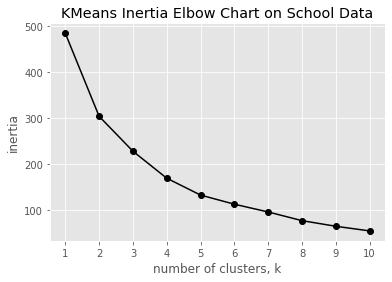

In [14]:
ks = range(1,11) #Set Range for Looping to 10
inertia = [] #Initiate Inertia List

for k in ks:
    model = KMeans(n_clusters = k) #Execute Kmeans Cluster Algo
    model.fit(det_school_X1) #Fitting Kmeans Cluster Model
    inertia.append(model.inertia_) #Add Clusters to Inertia List
    
plt.plot(ks, inertia, '-o', color='black') #Plot Cluster Elbow Chart
plt.xlabel('number of clusters, k') #Label x Axis Chart
plt.ylabel('inertia') #Label y Axis Chart
plt.title('KMeans Inertia Elbow Chart on School Data') #Label Title Chart
plt.xticks(ks) #Set x Ticks
plt.show() #Show Chart

In [15]:
det_km = KMeans(n_clusters=4)
det_km.fit(det_school_X1) #fit model on 4 clusters
det_predict = det_km.predict(det_school_X1) #execute predictions for kmeans clusters with 4 clusters

In [16]:
det_school_working_df['cluster'] = pd.Series(det_predict, index=det_school_working_df.index) #join dataframs
#det_school_working_df.head() #Showing Head for Confirmation

In [17]:
# INTERPRET
cluster_groups = det_school_working_df.groupby(['cluster']).agg(['mean']).round(2).reset_index()
cluster_groups

,cluster,StateLocalPpeSchoolShare,FederalPpeSchoolShare,TotalPpeTotal,Students,Teachers,studentsperteacher,NumberAboveAverageGrowth|English Language Arts,NumberAboveAverageGrowth|Social Studies,NumberAverageGrowth|English Language Arts,...,PercentBelowAverage|English Language Arts,PercentBelowAverage|Mathematics,PercentBelowAverage|Social Studies,MeanSGP|English Language Arts,MeanSGP|Mathematics,MeanSGP|Social Studies,Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame,Basic Variables Income:Race And Ethnicity - Median Household Income Whi,"Husband-Wife Family, Own Children, Below Poverty",Basic Variables Income - Family Households Mean Family Household Income
,,mean,mean,mean,mean,mean,mean,mean,mean,mean,...,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
0,0,7040.91,1168.63,13737.94,976.00,47.50,20.98,38.20,42.40,76.4,...,38.06,43.18,34.24,42.62,41.94,45.88,31117.40,47932.60,220.60,51024.60
1,1,9776.05,2345.08,17649.53,356.36,24.29,14.99,9.29,8.79,27.5,...,43.75,49.84,46.99,39.06,35.70,37.28,21380.57,38336.93,176.93,40854.14
2,2,6147.62,904.77,12580.80,2136.50,95.00,22.58,107.00,69.00,179.5,...,31.85,35.40,46.35,47.80,45.85,37.95,12225.00,23867.50,425.50,34023.50
3,3,10167.16,1077.99,16773.55,482.00,23.00,20.96,5.00,5.00,5.0,...,5.00,5.00,5.00,5.00,5.00,5.00,15461.00,37354.00,83.00,30789.00


After creating the clusters, the Total PPE was graphed against the percent of average growth in mathematics and English. The Mathematics and English Language Arts tests are the two most common tests taken amongst all schools within the district and at all grade levels. Our goal is to see if there is a pattern between clusters for PPE and growth in the top two most common test subjects. From the graph it can be seen that the fourth cluster group (cluster 3) is the smallest of the clusters. This cluster has a very low percent growth in both Mathematics and English. Upon further investigation, this is due to a lack of testing data for that group of students. The other three clusters (clusters 0, 1 and 2 as seen in the graphs ) are not very easy to distinguish from one another. We concluded that group 1 (cluster 0) includes schools with the highest Total PPE that have a percent growth in the two subjects explored between 25% and 48%. Group 3 (cluster 2) shows students who have a more mid to high range percent growth between 34% and 50% and have mid to lower range for PPE. Group 2 (cluster 1) is a much smaller cluster of schools that have a very refined range of percent growth for test scores between 41% and 43% and the lowest PPE of all of the clusters. 

<AxesSubplot:xlabel='TotalPpeTotal', ylabel='PercentAverageGrowth|English Language Arts'>

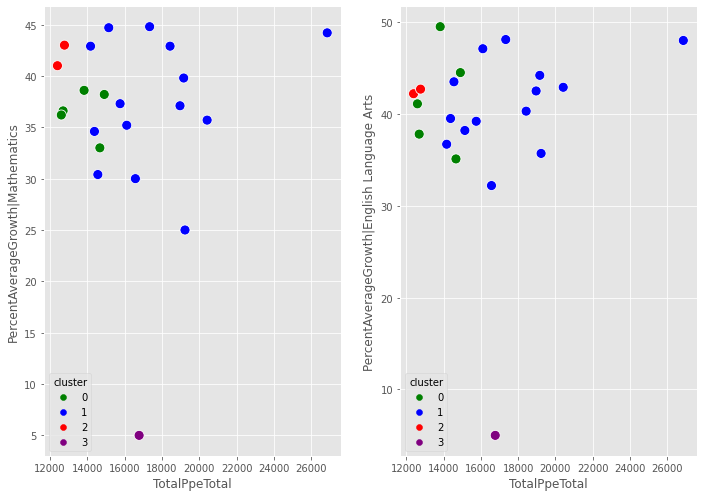

In [18]:
# CLUSTER SCATTERPLOT #
fig, (ax1, ax2) = plt.subplots(1,2)
fig.set_size_inches(11.7, 8.27)

sns.scatterplot(x=det_school_working_df['TotalPpeTotal'], y=det_school_working_df['PercentAverageGrowth|Mathematics'], ax=ax1, hue=det_school_working_df['cluster'], palette=['green', 'blue', 'red', 'purple'], s=100)
sns.scatterplot(x=det_school_working_df['TotalPpeTotal'], y=det_school_working_df['PercentAverageGrowth|English Language Arts'], ax=ax2, hue=det_school_working_df['cluster'], palette=['green', 'blue', 'red', 'purple'], s=100)

## Are Certain Testing Groups Exhibiting Lower Average Growth?

Our dataset on test score data includes various different testing groups including race, economic status, gender, and disability status. In order to see if the testing groups differ between zip code boundaries, each testing groups percent average growth for their zip code boundary is visualized. While creating these visualizations and with numerical evidence we were able to conclude that there is not enough data on racial groups to draw meaningful conclusions on their differences. We continued in visualizing the differences between Economically Disadvantaged, Not Economically Disadvantaged, students with and without Disabilities and Male and Female students. 

In [19]:
#loading in data
test = pd.read_csv('/work/SIADS697_TeamMADScientists/assets/testing_data/DPSCD_OpenData_MSTEP_Growth_2018-2019_20191101.csv')
zip_code = pd.read_csv('/work/SIADS697_TeamMADScientists/assets/testing_data/DPSCD_School_List_2018-2019_20190226.csv')
#dropping duplicate columns
zip_code = zip_code.drop(['SchoolYear', 'BuildingCode', 'DistrictCode', 'DistrictName', 'EntityType', 'COUNTY_NAME', 'LOCALE_NAME', 'SCHOOL_LEVEL', 'SCHOOL_TYPE', 'SETTING'], axis = 1)
test = test.drop(['IsdCode','IsdName'], axis = 1)
#merging zipcode and test data
df_test = test.merge(zip_code, how='inner', on='BuildingName')

In [20]:
#changing values with < or > to just the number in order to plot easier
df_test['NumberAboveAverageGrowth'] = df_test['NumberAboveAverageGrowth'].replace('< 10', 10)
df_test['NumberAverageGrowth'] = df_test['NumberAverageGrowth'].replace('< 10', 10)
df_test['NumberBelowAverageGrowth'] = df_test['NumberBelowAverageGrowth'].replace('< 10', 10)
df_test['PercentAboveAverage'] = df_test['PercentAboveAverage'].replace('< 10', 10)
df_test['PercentAboveAverage'] = df_test['PercentAboveAverage'].replace('< 5', 5)
df_test['PercentAverageGrowth'] = df_test['PercentAverageGrowth'].replace('< 10', 10)
df_test['PercentAverageGrowth'] = df_test['PercentAverageGrowth'].replace('< 5', 5)
df_test['PercentBelowAverage'] = df_test['PercentBelowAverage'].replace('< 10', 10)
df_test['PercentBelowAverage'] = df_test['PercentBelowAverage'].replace('< 5', 5)
df_test['TotalIncluded'] = df_test['TotalIncluded'].replace('< 10', 10)
df_test['MeanSGP'] = df_test['MeanSGP'].replace('< 10', 10)

In [21]:
#normalizing all of the quantitative data because the number of individuals for different groups differ so much
col = ['NumberAboveAverageGrowth', 'NumberAverageGrowth', 'NumberBelowAverageGrowth', 'PercentAboveAverage', 'PercentAverageGrowth', 'PercentBelowAverage', 'TotalIncluded', 'MeanSGP' ]

#turning objects into floats
for col_name in col:
    df_test[col_name] =  df_test[col_name].astype(float)

new_cols = []
for col_name in col:
    x = np.array(df_test[col_name])
    norm = preprocessing.normalize([x])
    new_cols.append(norm)

In [22]:
#creating a subset of the dataframe to compare different groups of students within schools
df_test = df_test[['SchoolYear','BuildingName','CountyName', 'SchoolLevel',
       'Locale', 'Grade', 'Subject', 'TestingGroup', 'ISDCode', 'ISDName', 'Status', 'SCHOOL_EMPHASIS',
       'PhoneNumber', 'ADDRESS_LINE_1', 'CITY', 'STATE', 'ZIP_CODE']]

NumberAboveAverageGrowth = new_cols[0][0].tolist()
NumberAverageGrowth = new_cols[1][0].tolist()
NumberBelowAverageGrowth = new_cols[2][0].tolist()
PercentAboveAverage = new_cols[3][0].tolist()
PercentAverageGrowth = new_cols[4][0].tolist()
PercentBelowAverage = new_cols[5][0].tolist()
TotalIncluded =  new_cols[6][0].tolist()
MeanSGP = new_cols[7][0].tolist()

df_test['NumberAboveAverageGrowth'] = NumberAboveAverageGrowth
df_test['NumberAverageGrowth'] = NumberAverageGrowth
df_test['NumberBelowAverageGrowth'] = NumberBelowAverageGrowth
df_test['PercentAboveAverage'] = PercentAboveAverage
df_test['PercentAverageGrowth'] = PercentAverageGrowth
df_test['PercentBelowAverage'] = PercentBelowAverage
df_test['TotalIncluded'] = TotalIncluded
df_test['MeanSGP'] = MeanSGP


In [23]:
#comparing groups of interest between schools within zipcode areas
df_compare_some = df_test.loc[((df_test['TestingGroup'] == 'Students with Disabilities') | (df_test['TestingGroup'] == 'Students without Disabilities') | (df_test['TestingGroup'] == 'Economically Disadvantaged') |
   (df_test['TestingGroup'] == 'Not Economically Disadvantaged') | (df_test['TestingGroup'] == 'Male') | (df_test['TestingGroup'] == 'Female')) & (df_test['Grade'] == 'All Grades')]
df_compare_some = df_compare_some.groupby(['ZIP_CODE', 'TestingGroup']).mean()
df_compare_some = df_compare_some.reset_index()
df_compare_some = df_compare_some.sort_values('NumberAboveAverageGrowth', axis = 0, ascending = True)

In [24]:
fig = px.bar(df_compare_some, x="PercentAverageGrowth", y="ZIP_CODE", orientation='h', facet_col="TestingGroup",
            color="TestingGroup", title="Zip Code Percent Average Growth for Each Testing Group", facet_col_wrap=3,
            category_orders={"TestingGroup": ["Economically Disadvantaged", "Students with Disabilities", "Female", "Not Economically Disadvantaged",
            "Students without Disabilities", "Male"]})

fig.update_layout(
    title={
        'text': "Zip Code Percent Average Growth for Each Testing Group",
        'y':0.9,
        'x':0.5}, 
        font=dict(
        family="sans-serif",
        size=10
    ))
fig.update_yaxes(type='category')
fig.update_xaxes(categoryorder='category ascending')
fig.update_traces(base="markers+lines")
fig.update_layout(showlegend=False)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))


To get a better idea of how much each group's average growth differs from another the mean of each group is calculated. 

In [25]:
#percent average growth per testing group
compared_mean = df_compare_some.groupby(['TestingGroup']).mean()
print('mean percent average growth for each testing group')
print(compared_mean['PercentAverageGrowth'])

mean percent average growth for each testing group
TestingGroup
Economically Disadvantaged        0.009406
Female                            0.009784
Male                              0.008591
Not Economically Disadvantaged    0.006619
Students with Disabilities        0.006838
Students without Disabilities     0.009970
Name: PercentAverageGrowth, dtype: float64


A visualization of the Mean Percent Average Growth per zip code gives us a good look at the differences that may exist between the zip codes to better focus our attention on locations that that would need further investigation. 

In [26]:
#percent average growth per zip code in all groups
zipcodemean = df_compare_some.groupby(['ZIP_CODE']).mean()
zipcodemean = zipcodemean.reset_index()
fig = px.bar(zipcodemean, x="PercentAverageGrowth", y="ZIP_CODE", orientation='h', title="Zip Code Mean Percent Average Growth")
fig.update_yaxes(type='category')

fig.update_layout(
    title={
        'text': "Zip Code Mean Percent Average Growth",
        'y':0.9,
        'x':0.5}, 
        font=dict(
        family="sans-serif",
        size=10
    ))

fig

From the visualization and mean calculations on the percent average growth of testing groups within each zip code boundary we can see that overall testing groups who are Economically Disadvantaged have a higher percent average growth than those who are Economically Advantaged. This finding strengthens our discovery of investments being directed towards the population of students that need it the most. Students without disabilities on average have a higher percent growth than students with disabilities and females have a slightly higher percent average growth than males. These two findings could be due to many different factors outside the scope of our research. The differences in percent average growth between testing groups and zip codes is not enough to make us consider that socioeconomic segregation may be a contributing factor. On average each of these groups is within a percent average growth range from .006 to .009. Although we will not be pursuing the possibility of socioeconomic segregation between testing groups, it is interesting to see how the testing groups differ from each other. Further investigation in to the causation of differences in percent average growth between testing groups within zip codes could lead to compelling findings about the dynamics of school priorities within zip code areas. 

## Let's Take a Deeper Look, but First, Data Manipulation

We begin by using the Pandas Python module to load the data.  After this we removed blank columns and irrelevant columns such as ten digit zip codes and phone numbers to make the data easier to work with, for both ourselves and the computer. Following this we engineered new features and removed schools that were outside of the project scope.

Next we conducted a similar process of cleaning and filtering for the student testing data.  We dropped columns that had no values in them and adjusted some of the school names to make it easier to join the different datasets together. After this we removed unwanted text data from a numeric column and then grouped our data together by school and testing groups.

Afterwards we cleaned and filtered the college enrollment data.  Again, we started by conducting a process similar to that of the previous datasets by removing irrelevant columns and adjusting school names.  After this cleaning was finished we matched schools that belonged to both the college enrollment and high school testing datasets.  We finished by fixing the numeric columns and grouping together the schools with subgroups. 

We finished by merging all of our data together, creating a separate dataset to compare differences between African American and White students. Then we concluded our data manipulation by grouping schools together by zip code. 


In [27]:
#Import raw per person exenditure dataset
ppe_df = pd.read_excel('/work/SIADS697_TeamMADScientists/assets/ppe_mi.xlsx', sheet_name = 'PPE')

#Load in raw testing information for 2018-2019 school year
hs_1819_df = pd.read_csv('/work/SIADS697_TeamMADScientists/assets/mstep_access_1819.csv')

#Load in raw college enrollment information for 2018-19 school year
college_en = pd.read_csv('/work/SIADS697_TeamMADScientists/assets/college_enrollment_1819.csv')

/usr/local/lib/python3.9/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning:

Unknown extension is not supported and will be removed



Clean and Filter PPE data

In [28]:
#Detroit City Zip Codes
zip_codes = [48127, 48239, 48219, 48223, 48228, 48126, 48120, 48217, 48235,
                48227, 48221, 48238, 48204, 48210, 48209, 48206, 48208, 48216,
                48203, 48202, 48201, 48226, 48234, 48212, 48211, 48207, 48205,
                48213, 48214, 48215, 48224, 48236, 48207]

#Irrelevant Columns to drop from ppe_df
cols_to_drop = ['DateExtracted','ST', 'STATENAME', 'LEAID', 'ST LEAID',
       'LEA NAME', 'SCHID', 'ST SCHID', 'ReportUrl', 'ZipCodePlusFour', 'Phone',
       'SY1819 SY_STATUS_TEXT', 'SY 1819 GSLO', 'SY1819 GSHI']

In [29]:
#Drop blank columns from ppe df
ppe_df.dropna(axis = 1, how = 'all', inplace = True)
ppe_df = ppe_df.drop(columns = cols_to_drop)

#Create new feature to show number of students per teacher at each school
ppe_df['studentsperteacher'] = ppe_df['Students']/ppe_df['Teachers']

In [30]:
#ppe_df filtering and transformations

#Filter to only schools in Detroit City zip codes
ppe_df = ppe_df[ppe_df['ZipCode'].isin(zip_codes)]

#Filter out school levels of non interest (elementary schools, middle schools, special ed, etc.)
ppe_df = ppe_df[ppe_df['SY1819 LEVEL'].isin(['High', 'Other'])]
ppe_df = ppe_df[ppe_df['SY1819 SCH_OR_LEA_TYPE'] != 'Special Education School']
ppe_df.drop('SY1819 SCH_OR_LEA_TYPE', axis = 1, inplace = True)

#Only use schools with more than ten students
ppe_df = ppe_df[ppe_df['Students'] > 10]

#Create new binary variable to describe schools who are heavily government funded or not
ppe_df = pd.get_dummies(ppe_df, columns = ['SY 1819 TITLEI_STATUS']).drop(columns = ['SY 1819 TITLEI_STATUS_Title I schoolwide eligible school-No program', 'SY 1819 TITLEI_STATUS_Title I targeted assistance school'])
ppe_df = ppe_df.rename({'SY 1819 TITLEI_STATUS_Not a Title I school': 'Not Title I Funded', 'SY 1819 TITLEI_STATUS_Title I schoolwide school': 'Title I Funded'}, axis = 1)

#Update School name for joining purposes
wsa_indexes = ppe_df[ppe_df['SCH NAME'] == 'WEST SIDE ACADEMY OF INFORMATION TECHNOLOGY AND CYBER SECURI'].index.values
ppe_df.loc[wsa_indexes, 'SCH NAME'] = 'WEST SIDE ACADEMY OF INFORMATION TECHNOLOGY AND CYBER SECURITY'

Clean and Filter Student Testing Data

In [31]:
#drop null columns from testing data
hs_1819_df.dropna(axis = 1, how = 'all', inplace = True)

#drop unwanted and uninformative columns from the testing data
cols_to_drop = ['IsdCode', 'IsdName','DistrictCode','DistrictName',
                'BuildingCode', 'CountyCode', 'CountyName', 'EntityType', 
                'Locale', 'SchoolLevel', 'Grade']
hs_1819_df = hs_1819_df.drop(columns = cols_to_drop)

In [32]:
#Filter school names for joining dataset on ppe_df
hs_1819_df['BuildingName'] = hs_1819_df.BuildingName.apply(str.upper)
mlk_indexes = hs_1819_df[hs_1819_df['BuildingName'] == 'MARTIN LUTHER KING JR. SENIOR HIGH SCHOOL'].index.values
hs_1819_df.loc[mlk_indexes, 'BuildingName'] = 'MARTIN LUTHER KING JR SENIOR HIGH SCHOOL'

In [33]:
#Alter 'Black' & 'White' testing groups to specific naming convention for grouping
hs_1819_df['TestingGroup'] = hs_1819_df['TestingGroup'].apply(lambda x: filter_groups(x))

In [34]:
#Remove unwanted text from numeric columns in testing data
for col in hs_1819_df.columns:
    hs_1819_df[col] = hs_1819_df[col].apply(lambda x: text_to_number(x))

#Group testing data by school and testing group
hs_1819_df = hs_1819_df.groupby(['BuildingName','TestingGroup']).mean().reset_index()

Clean and filter college enrollment data

In [35]:
#drop unwanted columns
college_en.dropna(axis = 1, how = 'all', inplace = True)
cols_to_drop = ['Gender', 'ISD Code', 'ISD OfficialName', 'DistrictCode', 'DistrictOfficialName' ,'BuildingCode', 'CountyCode', 'CountyName', 'EntityType', 'SchoolLevel', 'Locale', 'IHE Type']
college_en.drop(cols_to_drop, axis = 1, inplace = True)

#Clean up school names for merging
college_en['BuildingOfficialName'] = college_en.BuildingOfficialName.apply(str.upper)
mlk_indexes = college_en[college_en['BuildingOfficialName'] == 'MARTIN LUTHER KING JR. SENIOR HIGH SCHOOL'].index.values
college_en.loc[mlk_indexes, 'BuildingOfficialName'] = 'MARTIN LUTHER KING JR SENIOR HIGH SCHOOL'

In [36]:
#Match schools that belong to both datasets
college_schools = college_en.BuildingOfficialName.unique()

college_filter = []
for school in college_schools:
    if school in list(hs_1819_df.BuildingName.unique()):
        college_filter.append(school)

In [37]:
#Filter for majority races of DCPSC
subgroup_filter = ['All Students', 'White', 'African American']

#Filter college enrollment data for merging purposes
college_en = college_en[college_en['BuildingOfficialName'].isin(college_filter)]
college_en = college_en[college_en['Subgroup'].isin(subgroup_filter)]

#Filter testing data for merging purposes
hs_1819_df = hs_1819_df[hs_1819_df['TestingGroup'].isin(subgroup_filter)]

In [38]:
#Fix numbers as strings in numeric columns
college_en['Total Graduates (All Students)'] = college_en['Total Graduates (All Students)'].apply(lambda x: text_to_number(x))
college_en['Total Enrolled in an IHE within 0-6 months'] = college_en['Total Enrolled in an IHE within 0-6 months'].apply(lambda x: text_to_number(x))
college_en['Total % Enrolled in an IHE within 0-6 months'] = college_en['Total % Enrolled in an IHE within 0-6 months'].apply(lambda x: text_to_number(x))

In [39]:
#Group by school & subgroups of interest
college_en = college_en.groupby(['BuildingOfficialName', 'Subgroup']).mean().reset_index()

Merge dataframes for analysis

In [40]:
#Merge testing data with college enrollment data
merged = hs_1819_df.merge(college_en, left_on = ['BuildingName', 'TestingGroup'],
                                                right_on = ['BuildingOfficialName','Subgroup'])

#Drop redundant columns
merged.drop(['BuildingOfficialName', 'Subgroup'], axis = 1, inplace = True)

#Merge ppe data with combined testing/college enrollment data
merged = merged.merge(ppe_df, left_on= 'BuildingName', right_on = 'SCH NAME')

#Drop redundant columns
merged.drop(['SCH NAME', 'SCHOOL YEAR', 'SY1819 LEVEL', 'SY 1819 CHARTER_TEXT'], axis = 1, inplace = True)

#Merge demographic data onto combined data
merged = merged.merge(demo_zip_final, left_on = 'ZipCode', right_on = 'zip_code')
merged.drop('zip_code', axis = 1, inplace = True)

In [41]:
#Group df to compare african american and white students
race_comparison = merged[merged['TestingGroup'] != 'All Students']
# race_comparison

In [42]:
#Group schools by zip code for visualization
schools_by_zip = merged.groupby('ZipCode').mean().reset_index()
# schools_by_zip

##  Is funding the answer to Detroit's overall poor academic performance?

Many policy makers and citizens alike believe the gap in quality education can be lessened by investing more dollars into the students and faculty members of public schooling systems. Per Person Expenditure (PPE) is a metric used to explain how much money is spent on students and teachers via local, state and federal funding. The state of Michigan tracks this data on a per school basis, giving us the ability to analyze the discrepancies between financial expenditure and academic performance between the different zip codes that make up the Detroit Public Schools Community District. 

In [43]:
#Visualize percent of students who tested above average by zip code
above_avg = px.bar(schools_by_zip, x = 'ZipCode', y = 'PercentAboveAverage', color = 'TotalPpeTotal', color_continuous_scale = ['Red', 'White', 'Green'], text_auto = True)
above_avg.update_layout(xaxis_type = 'category')
above_avg.update_layout(xaxis={'categoryorder':'total descending'})

While the theory behind increased PPE leading to academic success may seem intuitive, it has not played out in the DPSCD. During the 2018-2019 school year, the two zip codes that produced the most proficient students with above average testing scores ranked extremely low in relative PPE expenditure. Nearly 30% of students in zip code 48235 produced above average testing scores while ranking dead last of all 17 zip codes in PPE. Zip code 48227 was close behind with 27% of their students falling into the advanced category while maintaining the fourth lowest PPE. In fact, even the top performing zip codes with the highest amounts of PPE finished the school year with over 10% less students falling into the above average category than the two mentioned above. This finding was contradictory to our initial hypothesis but after all, advanced students are only a small subset of any school. Does this hold true for the average student in Detroit?

Percent Average Growth is the metric used by the M-STEP testing system to describe students who performed at par with their peers. In this category, our two low funded zip codes from above, 48227 and 48235 appear in the top four schools for percentage of students who produced average level testing scores. On the contrary, the highest funded zip code based on PPE, 48208, produced the worst percentage of students who fall in this category with only 24%. While these results did not support our initial hypothesis, it seems the DSPC is attempting to invest in the students that may need the most help. Over time, increased funding to lower performing areas could flip the scales however we do not have the data to support that conclusion in Detroit's current state.

In [44]:
#Visualize average growth by PPE by zip code
avg_growth = px.bar(schools_by_zip, x = 'ZipCode', y = 'PercentAverageGrowth', color = 'TotalPpeTotal',
                    color_continuous_scale = ['Red', 'White', 'Green'], text_auto = True)
avg_growth.update_layout(xaxis_type = 'category')
avg_growth.update_layout(xaxis={'categoryorder':'total descending'})

Since money alone does not seem to be pushing the needle for academic success in Detroit public schools, we analyzed other factors that could be influencing general standardized testing scores. The amount of students each teacher is responsible for is another highly polarizing topic when it comes to academic success. Generally, the thought is that the less students an individual teacher has, the more time that teacher can spend with each student to help them through problems and the overall learning process. Interestingly in our analysis of the DPSCD, the two zip codes with the highest average testing scores in 2018-2019 were also the two zip codes with the highest number of students per teacher (approximately 24 students/teacher). Adversely, none of the five zip codes with the lowest number of students per teacher performed particularly well in terms of average testing scores.

In [45]:
#Visualize students/teacher & mean test scores by zip codes
test_scores_teachers = px.bar(schools_by_zip, x = 'ZipCode', y = 'studentsperteacher', color = 'MeanSGP', color_continuous_scale = ['Red', 'White', 'Green'], text_auto = True)
test_scores_teachers.update_layout(xaxis_type = 'category')
test_scores_teachers.update_layout(xaxis={'categoryorder':'total descending'})
test_scores_teachers

Clearly, something interesting is going on within the DSPCD. The first two hypotheses we formed around PPE expenditure and students per teacher were clearly uninformative of standardized testing scores. In order to test the viability of our initial hypotheses even further, we decided to test which socioeconomic characteristics may affect percent average growth by zip code using an OLS model with some of our predefined important features including household income and poverty characteristics.

In [46]:
#pluck variables for linear regression
ols_df = schools_by_zip[['PercentAverageGrowth', 'TotalPpeTotal', 'studentsperteacher', 
'Basic Variables Income - Family Households Mean Family Household Income',
'Basic Variables Educational Attainment - High School Graduate/GED']]

In [47]:
#Standardize variables for regression
scaler = StandardScaler()
ols_scaled = scaler.fit_transform(ols_df)

cols_to_rename = {'Basic Variables Income - Family Households Mean Family Household Income': 'mean_family_household_income',
                'Basic Variables Educational Attainment - High School Graduate/GED': 'hs_graduate_ged'}

ols_df_scaled = pd.DataFrame(ols_scaled, index = ols_df.index, columns = ols_df.columns)
ols_df_scaled.rename(cols_to_rename, axis = 1, inplace = True)

In [48]:
#Run OLS on variables
percent_growth_reg = smf.ols(formula = 'PercentAverageGrowth ~ TotalPpeTotal+studentsperteacher+mean_family_household_income+hs_graduate_ged', data = ols_df_scaled)
result_reg = percent_growth_reg.fit()

ols_robust = result_reg.get_robustcov_results('HC1')
print("OLS RESULTS:",ols_robust.summary())

OLS RESULTS:                              OLS Regression Results                             
Dep. Variable:     PercentAverageGrowth   R-squared:                       0.274
Model:                              OLS   Adj. R-squared:                  0.032
Method:                   Least Squares   F-statistic:                     1.769
Date:                  Sun, 21 Aug 2022   Prob (F-statistic):              0.200
Time:                          23:45:34   Log-Likelihood:                -21.398
No. Observations:                    17   AIC:                             52.80
Df Residuals:                        12   BIC:                             56.96
Df Model:                             4                                         
Covariance Type:                    HC1                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

##### Investigating Cause

In [49]:
# Copy DF
ci_df = det_school_working_df.copy()

ci_df['ln_PercentAverageGrowth|Mathematics'] = np.log(ci_df['PercentAverageGrowth|Mathematics'])
ci_df['ln_PercentAverageGrowth|English Language Arts'] = np.log(ci_df['PercentAverageGrowth|English Language Arts'])
ci_df['ln_TotalPpeTotal'] = np.log(ci_df['TotalPpeTotal'])

ci_df['binary_ppe'] = [1 if x >= ci_df['TotalPpeTotal'].mean() else 0 for x in ci_df['TotalPpeTotal']]
ci_df['binary_math'] = [1 if x >= ci_df['PercentAverageGrowth|Mathematics'].mean() else 0 for x in ci_df['PercentAverageGrowth|Mathematics']]
ci_df['binary_ela'] = [1 if x >= ci_df['PercentAverageGrowth|English Language Arts'].mean() else 0 for x in ci_df['PercentAverageGrowth|English Language Arts']]
ci_df['binary_income'] = [1 if x >= ci_df['Basic Variables Income - Family Households Mean Family Household Income'].mean() else 0 for x in ci_df['Basic Variables Income - Family Households Mean Family Household Income']]

# Adjust Dataframe Column
ci_df['FamilyHouseholdsMeanFamilyHouseholdIncome'] = ci_df['Basic Variables Income - Family Households Mean Family Household Income']
ci_df['PercentAverageGrowth_Mathematics'] = ci_df['PercentAverageGrowth|Mathematics']
ci_df['ln_PercentAverageGrowth_Mathematics'] = ci_df['ln_PercentAverageGrowth|Mathematics']
ci_df['PercentAverageGrowth_ELA'] = ci_df['PercentAverageGrowth|English Language Arts']
ci_df['ln_PercentAverageGrowth_ELA'] = ci_df['ln_PercentAverageGrowth|English Language Arts']
ci_df['HusbandWifeFamilyOwnChildrenBelowPoverty'] = ci_df['Husband-Wife Family, Own Children, Below Poverty']

The mean difference,  sometimes known as the difference in means, measures the absolute difference between the mean value in two different groups. (CSLB, 2022) In our case, it gives us an idea of how much difference there is between the averages of the our Per Pupil Spending and across several different features.

In [50]:
# PPE Binary - Math
pop_upPpe_mean_math = ci_df.query("binary_ppe==1")['ln_PercentAverageGrowth|Mathematics'].mean()
pop_downPpe_mean_math = ci_df.query("binary_ppe==0")['ln_PercentAverageGrowth|Mathematics'].mean()
mean_diffppe_math = round(pop_upPpe_mean_math-pop_downPpe_mean_math, 4)

# PPE Binary - ELA
pop_upPpe_mean_ela = ci_df.query("binary_ppe==1")['ln_PercentAverageGrowth|English Language Arts'].mean()
pop_downPpe_mean_ela = ci_df.query("binary_ppe==0")['ln_PercentAverageGrowth|English Language Arts'].mean()
mean_diffppe_ela = round(pop_upPpe_mean_ela-pop_downPpe_mean_ela, 4)

# INCOME Binary - Math
pop_upIncome_mean_math = ci_df.query("binary_income==1")['ln_PercentAverageGrowth|Mathematics'].mean()
pop_downIncome_mean_math = ci_df.query("binary_income==0")['ln_PercentAverageGrowth|Mathematics'].mean()
mean_diffincome_math = round(pop_upIncome_mean_math-pop_downIncome_mean_math, 4)

# INCOME Binary - ELA
pop_upIncome_mean_ela = ci_df.query("binary_income==1")['ln_PercentAverageGrowth|English Language Arts'].mean()
pop_downIncome_mean_ela = ci_df.query("binary_income==0")['ln_PercentAverageGrowth|English Language Arts'].mean()
mean_diffincome_ela = round(pop_upIncome_mean_ela-pop_downIncome_mean_ela, 4)

# INCOME Binary - PPE
pop_upIncome_mean_ppe = ci_df.query("binary_income==1")['ln_TotalPpeTotal'].mean()
pop_downIncome_mean_ppe = ci_df.query("binary_income==0")['ln_TotalPpeTotal'].mean()
mean_diffincome_ppe = round(pop_upIncome_mean_ppe-pop_downIncome_mean_ppe, 4)

print("Mean Diff - PPE/Math:",mean_diffppe_math)
print("Mean Diff - PPE/ELA:",mean_diffppe_ela)
print("Mean Diff - INCOME/Math:",mean_diffincome_math)
print("Mean Diff - INCOME/ELA:",mean_diffincome_ela)
print("Mean Diff - INCOME/PPE:",mean_diffincome_ppe)

Mean Diff - PPE/Math: -0.2437
Mean Diff - PPE/ELA: -0.2284
Mean Diff - INCOME/Math: 0.0611
Mean Diff - INCOME/ELA: 0.171
Mean Diff - INCOME/PPE: -0.0929


Determining the difference of means of two groups is sometimes enough (above are the the potential outcomes). Below, we can take it a step further, by calculating another difference measure called the Average Treatment Effect (ATE) which is expressed as:

![ATE Formula](images/image-20220814-214845.png)

ATE (Average Treatment Effect) is a measure used to compare treatments (or interventions) and, in our case, an evaluation of between ethnographies, investment, and performance. The ATE measures the difference in mean outcomes between units assigned to the treatment and units assigned to the control. (Verma, 2022)

A positive ATE would suggest that the higher the students test scores are, the more money a household makes and there are higher investments. A negative ATE would suggest that, the higher the students test scores are, the less money a household makes and there are higher investments. An ATE estimate equal to zero would suggest that there was no advantage or disadvantage.

In [51]:
#1
cm1 = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_Mathematics.values,
    D=ci_df.binary_ppe.values,
    X=ci_df.FamilyHouseholdsMeanFamilyHouseholdIncome.values)

cm1.est_via_matching()

ate1 = round(cm1.estimates['matching']['ate'],4)
print("Avg. Treatement Effect PAG_Math, PPR, INCOME:", ate1)

#2
cm2 = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_ELA.values,
    D=ci_df.binary_ppe.values,
    X=ci_df.FamilyHouseholdsMeanFamilyHouseholdIncome.values)

cm2.est_via_matching()

ate2 = round(cm2.estimates['matching']['ate'],4)
print("Avg. Treatement Effect PAG_ELA, PPR, INCOME:", ate2)

Avg. Treatement Effect PAG_Math, PPR, INCOME: -0.2136
Avg. Treatement Effect PAG_ELA, PPR, INCOME: -0.1347


Here using the Causal Model function we get an unbiased estimate of the average treatment effect. And we can see that the effect of income  is reversed. The results are showing that correlation may not imply causality. In other words, our X and Y conditions could be showing that they are random variables. 

In [52]:
# Show Dataframe for Confirmation
ci_df

,SCHOOL NAME,StateLocalPpeSchoolShare,FederalPpeSchoolShare,TotalPpeTotal,Students,Teachers,studentsperteacher,NumberAboveAverageGrowth|English Language Arts,NumberAboveAverageGrowth|Social Studies,NumberAverageGrowth|English Language Arts,...,binary_ppe,binary_math,binary_ela,binary_income,FamilyHouseholdsMeanFamilyHouseholdIncome,PercentAverageGrowth_Mathematics,ln_PercentAverageGrowth_Mathematics,PercentAverageGrowth_ELA,ln_PercentAverageGrowth_ELA,HusbandWifeFamilyOwnChildrenBelowPoverty
0,ACADEMY OF THE AMERICAS HIGH SCHOOL,7661.38,4146.73,17336.51,123,7.0,17.571429,5.0,5.0,13.0,...,1,1,1,0,38777.0,44.8,3.802208,48.1,3.873282,94.0
1,BENJAMIN CARSON HIGH SCHOOL OF SCIENCE AND MED...,8109.36,1507.06,15144.82,383,23.0,16.652174,11.0,17.0,29.0,...,0,1,0,0,30842.0,44.7,3.799974,38.2,3.642836,50.0
2,CASS TECHNICAL HIGH SCHOOL,6110.61,753.91,12392.92,2393,109.0,21.954128,110.0,101.0,204.0,...,0,1,1,0,30842.0,41.0,3.713572,42.2,3.742420,50.0
3,CENTRAL HIGH SCHOOL,6756.73,1884.08,14169.21,306,21.5,14.232558,5.0,5.0,18.0,...,0,1,0,0,41940.0,42.9,3.758872,36.7,3.602777,148.0
4,CODY HIGH SCHOOL,9466.99,757.77,15753.16,704,54.5,12.917431,11.0,15.0,51.0,...,0,1,0,1,42657.0,37.3,3.618993,39.2,3.668677,702.0
5,COMMUNICATION AND MEDIA ARTS HIGH SCHOOL,7441.53,852.03,13821.96,577,24.0,24.041667,22.0,34.0,50.0,...,0,1,1,1,45789.0,38.6,3.653252,49.5,3.901973,360.0
6,DAVIS AEROSPACE TECHNICAL HIGH SCHOOL AT GOLIG...,11755.53,3135.92,20419.86,168,12.0,14.000000,5.0,5.0,18.0,...,1,0,1,0,41213.0,35.7,3.575151,42.9,3.758872,99.0
7,DENBY HIGH SCHOOL,6224.89,2623.23,14376.52,505,26.5,19.056604,12.0,5.0,32.0,...,0,0,0,1,51172.0,34.6,3.543854,39.5,3.676301,130.0
8,DETROIT COLLEGIATE PREPARATORY HIGH SCHOOL AT ...,9727.91,3175.51,18431.82,429,31.5,13.619048,10.0,11.0,25.0,...,1,1,1,0,30789.0,42.9,3.758872,40.3,3.696351,83.0
9,DETROIT INTERNATIONAL ACADEMY FOR YOUNG WOMEN,11082.54,2551.86,19162.79,263,24.5,10.734694,18.0,5.0,38.0,...,1,1,1,1,46793.0,39.8,3.683867,44.2,3.788725,140.0


In [53]:
cm_array_n = np.array([ci_df.FamilyHouseholdsMeanFamilyHouseholdIncome,
                       ci_df.Teachers,
                       ci_df.Students,
                       ci_df.HusbandWifeFamilyOwnChildrenBelowPoverty])

cm_array_n = cm_array_n.T.reshape(22,4)

In [54]:
# ATE ELA
cm_ela = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_ELA.values, 
    D=ci_df.binary_ppe.values, 
    X=cm_array_n)

cm_ela.est_propensity()
cm_ela.est_via_matching()

ate2_ela = round(cm_ela.estimates['matching']['ate'],4)
print("Avg. Treatement Effect ELA:", ate2_ela)

# ATE MATH
cm_math = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_Mathematics.values, 
    D=ci_df.binary_ppe.values, 
    X=cm_array_n)

cm_math.est_propensity()
cm_math.est_via_matching()

ate2_math = round(cm_math.estimates['matching']['ate'],4)
print("Avg. Treatement Effect MATH:", ate2_math)

Avg. Treatement Effect ELA: -0.1393
Avg. Treatement Effect MATH: -0.222


To help verify this, let's go ahead and build an OLS regression model, given we how know our most important features. OLS, which is short for Ordinary Least Squares, is a method used to estimate the parameters in a linear regression model. 

In [55]:
# OLS ELA
model_ela = smf.ols(formula = 'ln_PercentAverageGrowth_ELA ~ binary_ppe+FamilyHouseholdsMeanFamilyHouseholdIncome+Teachers+Students+HusbandWifeFamilyOwnChildrenBelowPoverty', data = ci_df)
result_ela = model_ela.fit()

ols_robust_ela = result_ela.get_robustcov_results('HC1')
print("OLS ELA RESULTS:",ols_robust_ela.summary())

# OLS MATH
model_math = smf.ols(formula = 'ln_PercentAverageGrowth_Mathematics ~ binary_ppe+FamilyHouseholdsMeanFamilyHouseholdIncome+Teachers+Students+HusbandWifeFamilyOwnChildrenBelowPoverty', data = ci_df)
result_math = model_math.fit()

ols_robust_math = result_math.get_robustcov_results('HC1')
print("OLS MATH RESULTS:",ols_robust_math.summary())

OLS ELA RESULTS:                                  OLS Regression Results                                
Dep. Variable:     ln_PercentAverageGrowth_ELA   R-squared:                       0.134
Model:                                     OLS   Adj. R-squared:                 -0.136
Method:                          Least Squares   F-statistic:                    0.2640
Date:                         Sun, 21 Aug 2022   Prob (F-statistic):              0.926
Time:                                 23:45:34   Log-Likelihood:                -12.183
No. Observations:                           22   AIC:                             36.37
Df Residuals:                               16   BIC:                             42.91
Df Model:                                    5                                         
Covariance Type:                           HC1                                         
                                                coef    std err          t      P>|t|      [0.025      

The two main things to summarize the wealth of insight we get from an OLS model report includes:

1. The adj. R-squared is 0.134 and 0.147 respectively for math and language percent average growth. This means that around 13 to 15 of all variations in our data can be explained by our model, which isn't very good. 

undefined. The p-values for features tested are all more than 0.2, which indicated that they don't have a significant impact on test performance.

## Conclusion

We set out to investigate how income differences across schools and standardized testing correlated to inequality in socioeconomic resources in the Detroit Public School Community District (DPSCD). Understanding if inequalities exist will help parents and students make an informed decisions on which schools will be the best fit. Additionally, district authorities can understand if there are schools within the district that need attention. 

We began our research by revealing that families below poverty versus Total PPE and Household Income versus Total PPE exhibit a moderate negative relationship which may tell us that more investment for students is going to the students that need it, which is a great sign!

Next we visualized the differences in percent Average growth between testing groups in zip code areas. We saw that the economically disadvantaged students tended to have a higher percent average growth than economically advantaged students which could indicate again that investments are going towards the population of students that are in need. 

Furthermore, our hypotheses around PPE expenditure and students per teacher were clearly uninformative of standardized testing scores. Since money alone does not seem to be pushing the needle for academic success in Detroit public schools, we analyzed other factors that could be influencing general standardized testing scores. The amount of students each teacher is responsible for is another highly polarizing topic when it comes to academic success.

In order to test this further, we ran an OLS regression model including these two features along with the mean household income and an educational attainment variable that measures the high school graduation rate for each zip code. In solidarity with our previous findings, none of the variables were found to be statistically significant on average testing scores. While students per teacher seemed to have a strong correlation with increasing average test scores, it was not found to be statistically significant.

Our research resulted in unexpected findings. The outcomes we saw may suggest DPCSD is making adjustments for the benefit of the total community, rather than feeding into inequality in socioeconomic resources. Our findings did result with effect sizes that were too small to be detected. In other words, our data did not give us direct insight into the relationships of interest to confirm or deny that DPCSD is causing inequality in socioeconomic resources.

Now, can we prove that DPCSD is investing in underserved at risk areas of Detroit? We believe further research is required. By looking further back to pre-pandemic time periods and continuing to monitor PPE and standardized testing scores moving forward, a better understanding of DPCSD's financial decisions will surface.

## Explore the Data!

Explore our data with these map visuals. 

##### MICHIGAN SCHOOL ENROLLMENT BOUNDARIES

- "Michigan School Enrollment Boundary Map" - Shows DSCSD is an Open Enrollment District. Open Enrollment makes it slightly more difficult to understand the school enrollment and where the students truly live.

In [56]:
## MAPPING DATAFRAMES ##

# Dataframes with Shapely Coordinates
school_marker_df = point_func(detroit_school_marker_df)

# ZIP CODE DEMOGRAPHIC X MAPPING (JOINING)
geodf_det_zip['zip_code'] = geodf_det_zip['zip_code'].astype(int)
demo_zip_final['zip_code'] = demo_zip_final['zip_code'].astype(int)
df_zip_code = geodf_det_zip.merge(demo_zip_final, on='zip_code', how='inner').drop_duplicates()
df_ppe_testing = det_school_working_df.merge(detroit_school_marker_df, on='SCHOOL NAME', how='inner')

# ZIP CODE GROUPBY
zip_groups = ppe_testing_df_all_mod.groupby(['zip_code']).agg(['mean']).round(2).reset_index()
zip_groups_merge = geodf_det_zip.merge(zip_groups, on='zip_code', how='inner').drop_duplicates()
zip_groups_merge.columns = zip_groups_merge.columns.map(''.join)

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:112: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/reshape/merge.py:648: UserWarning:

merging between different levels can give an unintended result (1 levels on the left,2 on the right)

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/generic.py:4153: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.



In [57]:
### DETROIT BOUNDARY MAP ###
detroit_map_bounderies = folium.Map(location=[42.3314,-83.0458], zoom_start=10)

folium.GeoJson(data=geodf_dcs_mi,
               tooltip=folium.features.GeoJsonTooltip(fields=['schnam'],aliases=['School Name'],labels=True,sticky=False),
               style_function=lambda x: {'Color': x['properties']['color'], 'fillColor': 'gold'}).add_to(detroit_map_bounderies)

detroit_map_bounderies

##### DETROIT ZIP CODE X SCHOOL MAP

- "Detroit Zip Code X School Map" - This is our crown jewel for visually representing the data layered on top of each other. The map pins are the schools we investigated - colors representing their clusters. Underneath the map pins feel free to toggle the data and visually see how income and test scores shift between clusters.

Cluster 0 = Red
Cluster 1 = Beige
Cluster 2 = Blue
Cluster 3 = Green

In [58]:
### DETROIT ZIP/POINT MAP ###
detroit_map = folium.Map(location=[42.3314,-83.0458], zoom_start=10, tiles=None,overlay=False)

#Color Mapping
colormap = cm.linear.RdYlGn_09.to_step(10)
colormap.caption = "Index"
colormap.add_to(detroit_map)

#MARKERS
for index, row in df_ppe_testing.iterrows():
    if row['cluster'] == 0:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='red')).add_to(detroit_map)
    elif row['cluster'] == 1:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='beige')).add_to(detroit_map)
    elif row['cluster'] == 2:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='blue')).add_to(detroit_map)
    else:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='green')).add_to(detroit_map)

fg1 = folium.FeatureGroup(name='Median Household Income BlacAfric Ame',overlay=False).add_to(detroit_map)
fg2 = folium.FeatureGroup(name='Median Household Income Whit Ame',overlay=False).add_to(detroit_map)
fg3 = folium.FeatureGroup(name='PercentAverageGrowth|Mathematics',overlay=False).add_to(detroit_map)
fg4 = folium.FeatureGroup(name='PercentAverageGrowth|English Language Arts',overlay=False).add_to(detroit_map)
fg5 = folium.FeatureGroup(name='Family Households Mean Family Household Income',overlay=False).add_to(detroit_map)
fg6 = folium.FeatureGroup(name='Husband-Wife Family, Own Children, Below Poverty',overlay=False).add_to(detroit_map)

#CHOROPLETH 1
cho_1 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Median Household Income BlacAfric Ame",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg1)

#CHOROPLETH 2
cho_2 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Basic Variables Income:Race And Ethnicity - Total Whi Households'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Median Household Income White Ame",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg2)

#CHOROPLETH 3
cho_3 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=zip_groups_merge,
                          columns=['zip_code','PercentAverageGrowth|Mathematicsmean'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="PercentAverageGrowth|Mathematics",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg3)

#CHOROPLETH 4
cho_4 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=zip_groups_merge,
                          columns=['zip_code','PercentAverageGrowth|English Language Artsmean'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="PercentAverageGrowth|English Language Arts",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg4)

#CHOROPLETH 5
cho_5 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Basic Variables Income - Family Households Mean Family Household Income'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Family Households Mean Family Household Income",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg5)

#CHOROPLETH 6
cho_6 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Husband-Wife Family, Own Children, Below Poverty'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Husband-Wife Family, Own Children, Below Poverty",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg6)

# Add hover functionality.
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

Tooltip_Layer = folium.features.GeoJson(
    data = zip_groups_merge,
    style_function=style_function, 
    control=False,
    #highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['zip_code','Basic Variables - Total Populationmean','Basic Variables Income - Family Households Mean Family Household Incomemean','Basic Variables School Enrollment (Pop 3+):Total-Gra 9 to gra 12mean','Husband-Wife Family, Own Children, Below Povertymean','TotalPpeTotalmean','PercentAverageGrowth|Mathematicsmean','PercentAverageGrowth|English Language Artsmean'],
        aliases=['Detroit Zip Code','Total Population','Median HH Income ($)','Total Private/Public Grade 9-12 School Enrollment','Families Below Poverty','Total PPE ($)','PercentAverageGrowth|Mathematics','PercentAverageGrowth|English Language Arts'],
        localize=False,
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
detroit_map.add_child(Tooltip_Layer)
detroit_map.keep_in_front(Tooltip_Layer)

# Add Dark and Light Mode 
folium.TileLayer('cartodbdark_matter',overlay=True,name="View in Dark Mode").add_to(detroit_map)
folium.TileLayer('cartodbpositron',overlay=True,name="Viw in Light Mode").add_to(detroit_map)

# Layer controller. 
folium.LayerControl(collapsed=False).add_to(detroit_map)

detroit_map

## Citations

Broer, M., Bai, Y., Fonseca, F. (2019). Socioeconomic Inequality and Educational Outcomes: An Introduction. In: Socioeconomic Inequality and Educational Outcomes. IEA Research for Education, vol 5. Springer, Cham. https://doi.org/10.1007/978-3-030-11991-1_1

CSLB, (2022). Home.csulb.edu. 2022. Tests of Statistical Significance. Retrieved August 16, 2022, from https://home.csulb.edu/~msaintg/ppa696/696stsig.htm

Koehrsen W. (2018, Jan 9). Hyperparameter Tuning the Random Forest in Python
Towards Data Science. Retrieved August 19, 2022, from https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

Monarrez, T. (2018, September 17). Do New York City's school attendance boundaries encourage racial and ethnic segregation? Urban Institute. Retrieved June 26, 2022, from https://www.urban.org/urban-wire/do-new-york-citys-school-attendance-boundaries-encourage-racial-and-ethnic-segregation

Molnar, C., 2022. 8.5 Permutation Feature Importance | Interpretable Machine Learning. Christophm.github.io. Retrieved August 16, 2022, from https://christophm.github.io/interpretable-ml-book/feature-importance.html

Navas, J. (2022, Feb 8). What is hyperparameter tuning? Anyscale. Retrieved August 18, 2022, from https://www.anyscale.com/blog/what-is-hyperparameter-tuning

Owens, A. (2018). Income segregation between school districts and inequality in students ... American Sociological Association. Retrieved June 26, 2022, from https://www.asanet.org/sites/default/files/attach/journals/jan18soefeature.pdf

Papay JP, Murnane RJ, Willett JB. Income-Based Inequality in Educational Outcomes: Learning From State Longitudinal Data Systems. Educational Evaluation and Policy Analysis. 2015;37(1_suppl):29S-52S. doi:10.3102/0162373715576364

Reardon, S. (2019, May 14). Income inequality affects our children's educational opportunities. Equitable Growth. Retrieved June 26, 2022, from https://equitablegrowth.org/income-inequality-affects-our-childrens-educational-opportunities/

Verma, Y., 2022. A Complete Guide to Causal Inference in Python. Analytics India Magazine. Retrieved August 16, 2022, from https://analyticsindiamag.com/a-complete-guide-to-causal-inference-in-python/

## Dependencies

In [59]:
%watermark --iversions

psycopg2   : 2.9.3 (dt dec pq3 ext lo64)
statsmodels: 0.13.2
folium     : 0.12.1.post1
fiona      : 1.8.21
json       : 2.0.9
requests   : 2.28.1
branca     : 0.5.0
pandas     : 1.2.5
matplotlib : 3.5.2
seaborn    : 0.11.2
sklearn    : 1.1.1
geopandas  : 0.11.1
shapely    : 1.8.2
numpy      : 1.23.1
plotly     : 5.9.0



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=e115903d-6f9d-4ba6-a598-8111e36ee3b2' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>